In [24]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import datetime

### Global Variables and Helper Functions:

In [25]:
FRAME_PATH = 'Frames'
DIMENSION = 240
BATCH_SIZE = 32
NOW = datetime.datetime.now()
CURRENT_TIME = NOW.strftime('%Y-%m-%d_%H')

train_frame = pd.read_pickle(os.path.join(FRAME_PATH, 'train_frame.pickle'))
valid_frame = pd.read_pickle(os.path.join(FRAME_PATH, 'valid_frame.pickle'))
test_frame  = pd.read_pickle(os.path.join(FRAME_PATH, 'test_frame.pickle'))

def save_checkpoint(model, path):
    torch.save({
        # 'epoch'               : epoch,
        # 'loss_min'            : loss_min,
        'model_state_dict'    : model.module.state_dict() if hasattr(model, 'module') else model.state_dict(),
        # 'optimizer_state_dict': optimizer.state_dict(),
        # 'scheduler_state_dict': scheduler.state_dict(),
    }, path)

### Datasets:

In [26]:
class Circle_Dataset(Dataset):
    def __init__(self, df, transform=None):
        self.image_paths = df['file_path'].values
        self.targets = np.array(df[['center_x_ratio', 'center_y_ratio']])
        self.sample_ids = np.array(df.index)
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, idx):
        image = np.load(self.image_paths[idx])
        image = torch.from_numpy(image).float().unsqueeze(0)
        target = torch.from_numpy(self.targets[idx]).float()
        sample_ids = torch.tensor(self.sample_ids[idx])
        if self.transform is not None:
            image = self.transform(image)
        return image, target, sample_ids
    
    def view_item(self, idx):
        image = np.load(self.image_paths[idx])
        plt.imshow(image, cmap='gray')
        plt.show()


CDS_train = Circle_Dataset(df=train_frame)
CDS_valid = Circle_Dataset(df=valid_frame)
CDS_test = Circle_Dataset(df=test_frame)

### Dataloader:

In [27]:
train_dataloader = DataLoader(dataset=CDS_train, batch_size=BATCH_SIZE, shuffle=True)
valid_dataloader = DataLoader(dataset=CDS_valid, batch_size=BATCH_SIZE, shuffle=True)
test_dataloader = DataLoader(dataset=CDS_test, batch_size=BATCH_SIZE, shuffle=False)


#_______/Test Output\________
img_custom, label_custom, sample_ids = next(iter(train_dataloader))

print(f'Image shape: {img_custom.shape} -> [batch_size, color channels, height, width]')
print(f'Label shape: {label_custom.shape}')
print(f'Sample_ids shape: {sample_ids.shape}')

Image shape: torch.Size([32, 1, 240, 240]) -> [batch_size, color channels, height, width]
Label shape: torch.Size([32, 2])
Sample_ids shape: torch.Size([32])


GROUND TRUTH center coordinate (x,y): [106, 116]
PREDICTED center coordinate (x,y): [107, 114]


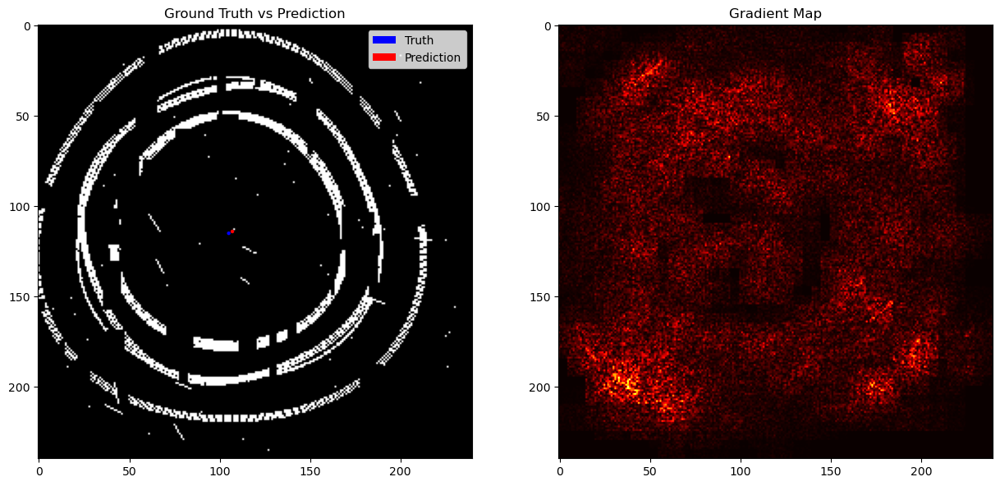

Epoch: 1 	Training Loss: 0.0013793275443733566 	Validation Loss: 0.00043408571957196626
GROUND TRUTH center coordinate (x,y): [107, 123]
PREDICTED center coordinate (x,y): [114, 121]


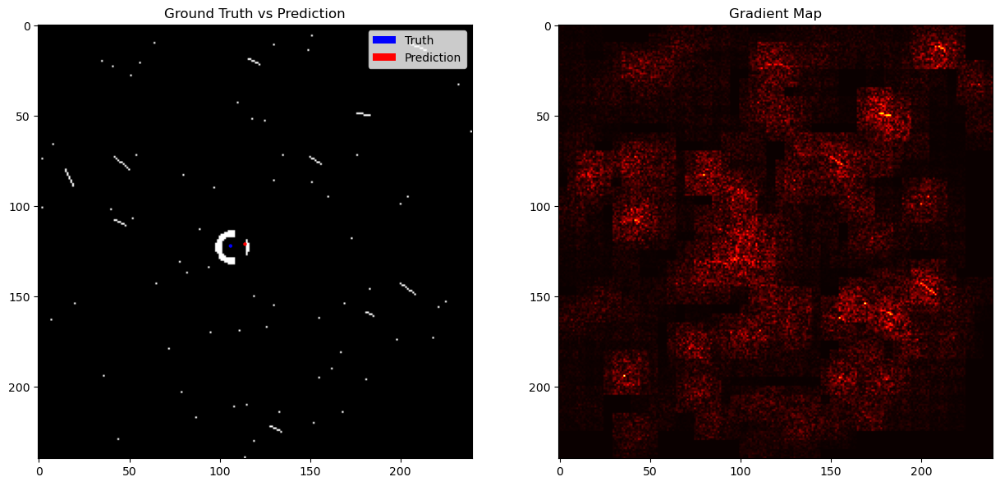

Epoch: 2 	Training Loss: 0.0003077707231665651 	Validation Loss: 0.0002486406926246774
GROUND TRUTH center coordinate (x,y): [124, 136]
PREDICTED center coordinate (x,y): [122, 136]


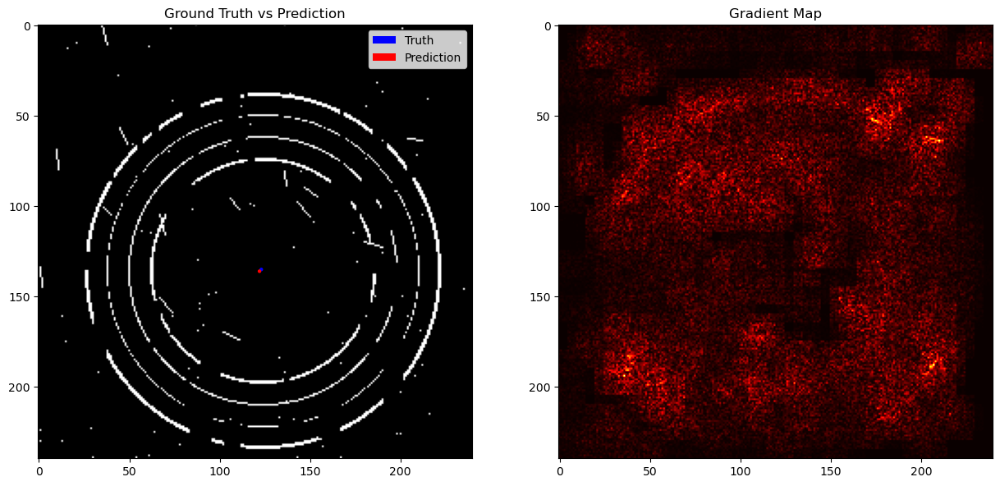

Epoch: 3 	Training Loss: 0.00018354542010153333 	Validation Loss: 0.00019073462882079184
GROUND TRUTH center coordinate (x,y): [117, 114]
PREDICTED center coordinate (x,y): [117, 112]


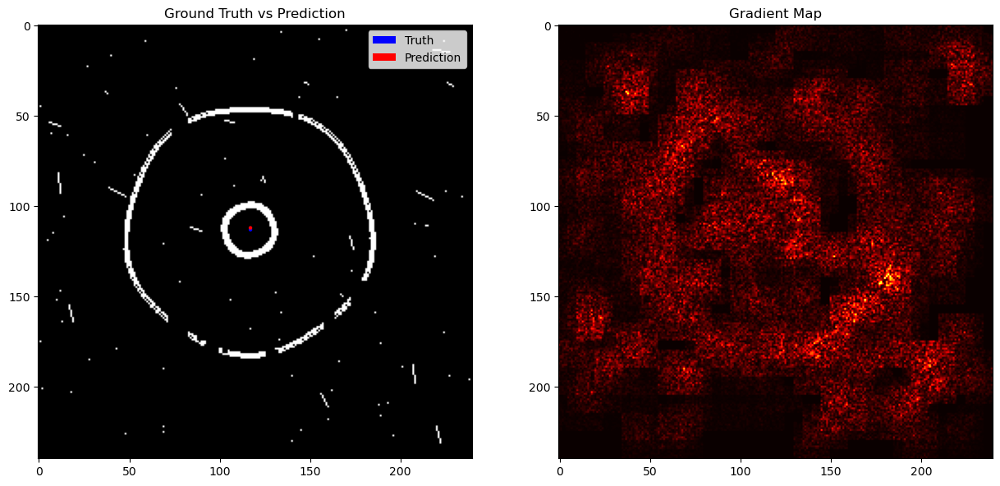

Epoch: 4 	Training Loss: 0.0001258729171887454 	Validation Loss: 0.00014646254925173706
GROUND TRUTH center coordinate (x,y): [137, 131]
PREDICTED center coordinate (x,y): [135, 126]


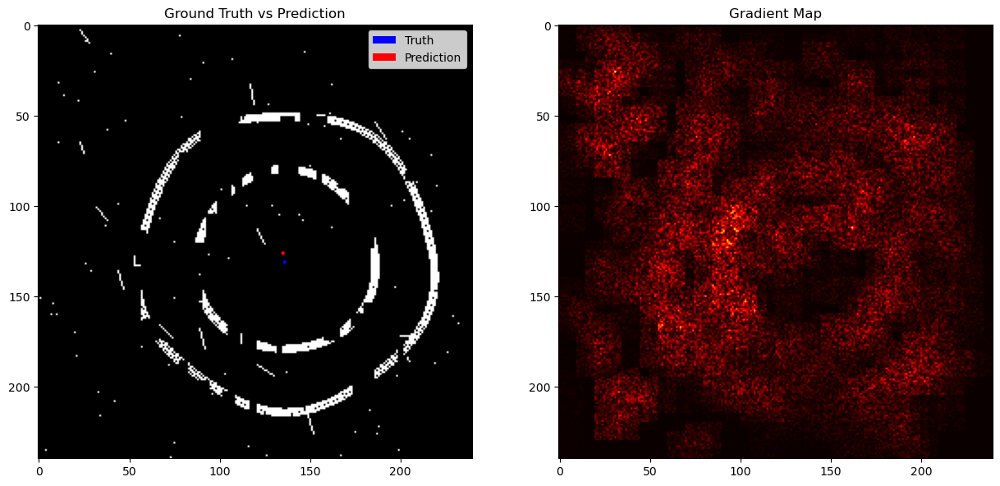

Epoch: 5 	Training Loss: 9.004266424259791e-05 	Validation Loss: 0.00013367180691825018
GROUND TRUTH center coordinate (x,y): [141, 97]
PREDICTED center coordinate (x,y): [140, 95]


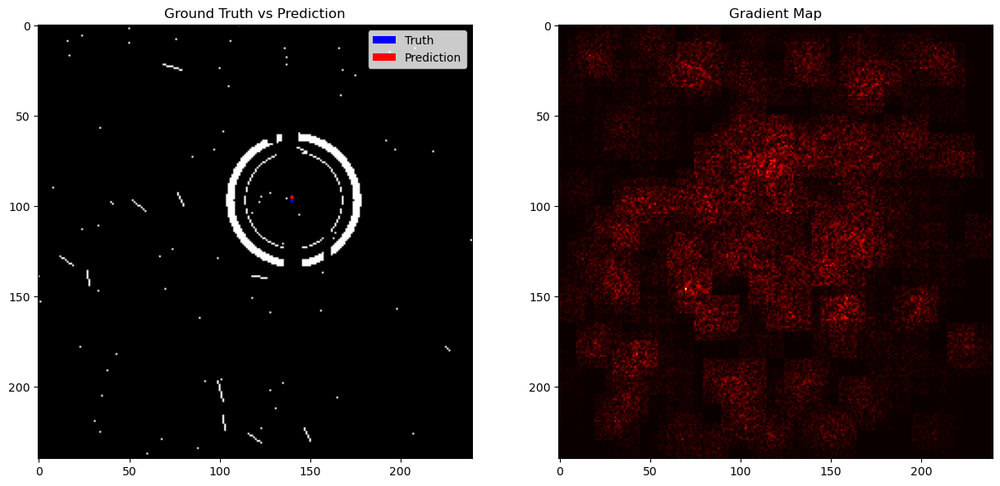

Epoch: 6 	Training Loss: 5.770572996374944e-05 	Validation Loss: 0.00010562068703843074
GROUND TRUTH center coordinate (x,y): [101, 110]
PREDICTED center coordinate (x,y): [99, 110]


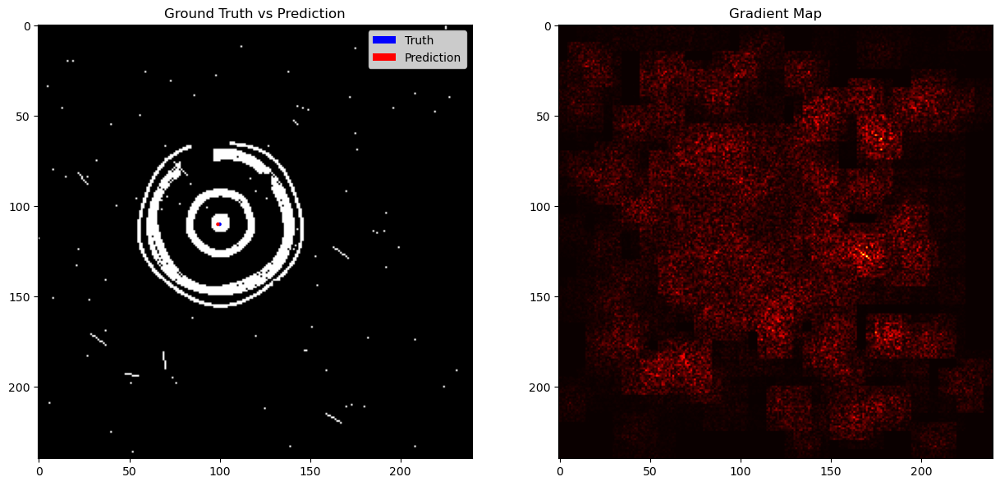

Epoch: 7 	Training Loss: 4.327364297932945e-05 	Validation Loss: 0.00010914244560343731
GROUND TRUTH center coordinate (x,y): [103, 137]
PREDICTED center coordinate (x,y): [101, 136]


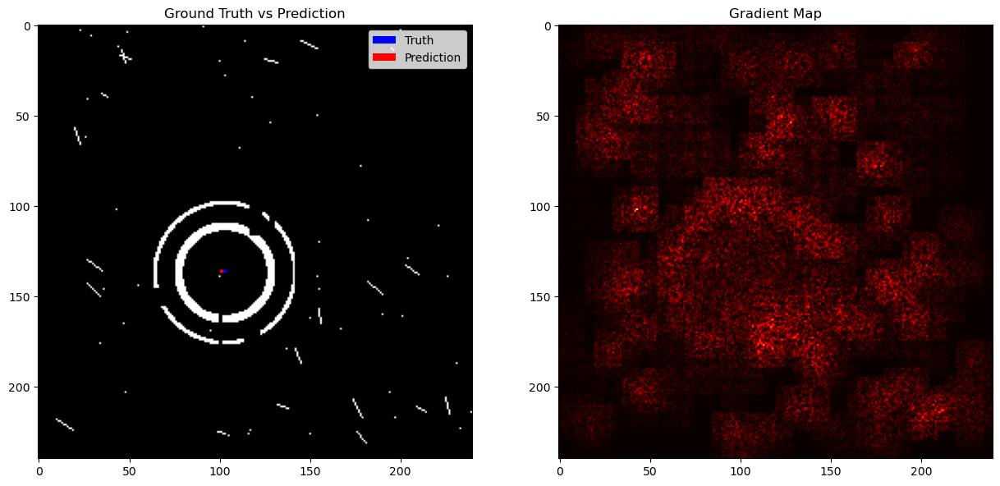

Epoch: 8 	Training Loss: 3.258240465947893e-05 	Validation Loss: 9.758719818718318e-05
GROUND TRUTH center coordinate (x,y): [115, 110]
PREDICTED center coordinate (x,y): [116, 108]


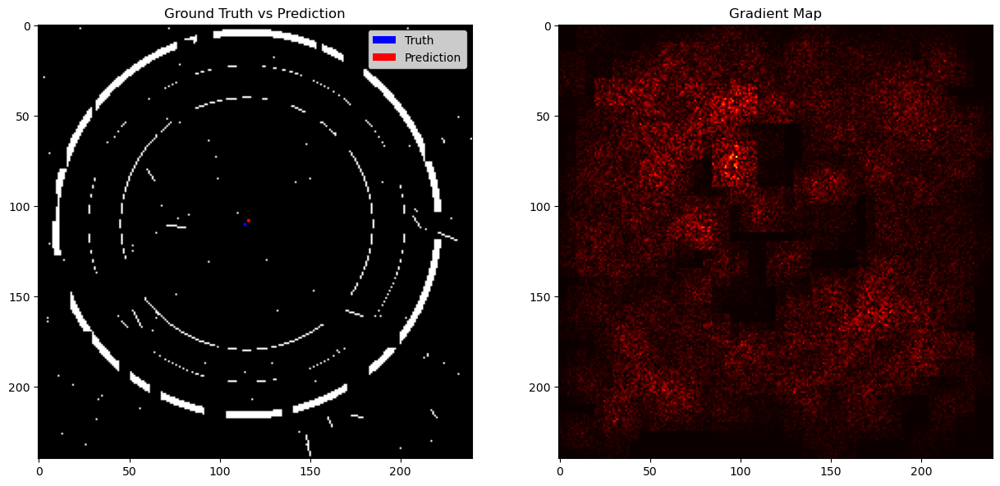

Epoch: 9 	Training Loss: 2.1545333622877176e-05 	Validation Loss: 9.680761655585633e-05
GROUND TRUTH center coordinate (x,y): [133, 139]
PREDICTED center coordinate (x,y): [134, 137]


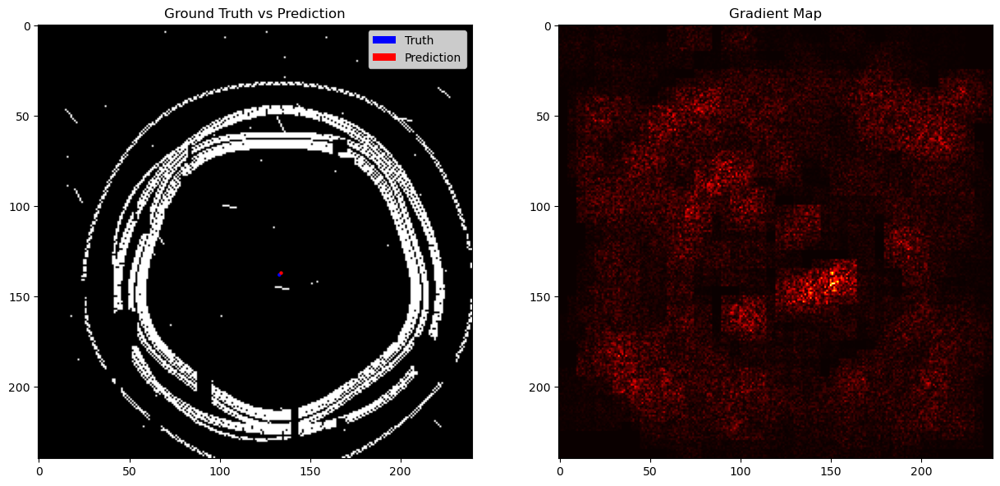

Epoch: 10 	Training Loss: 1.7400674801643213e-05 	Validation Loss: 9.41125573105334e-05
GROUND TRUTH center coordinate (x,y): [105, 129]
PREDICTED center coordinate (x,y): [105, 129]


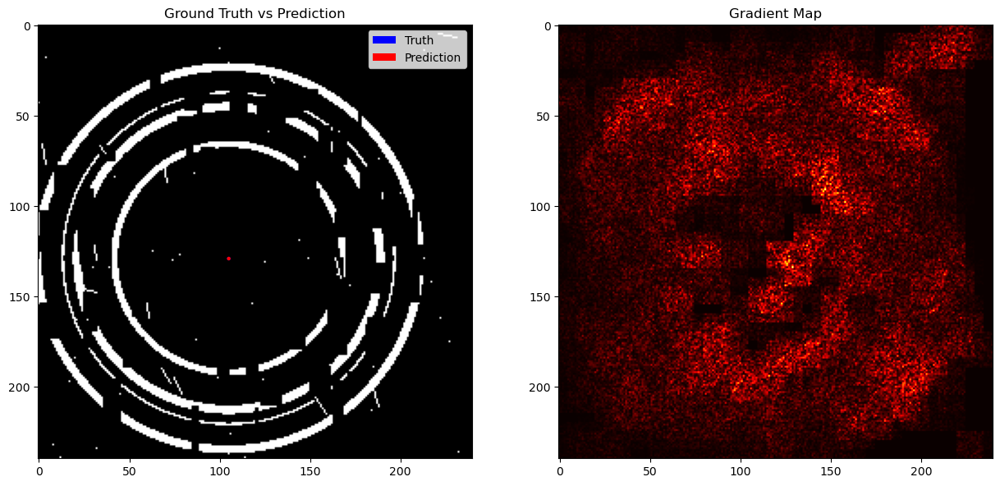

Epoch: 11 	Training Loss: 1.5229964349903942e-05 	Validation Loss: 9.363133558589551e-05
GROUND TRUTH center coordinate (x,y): [138, 126]
PREDICTED center coordinate (x,y): [137, 127]


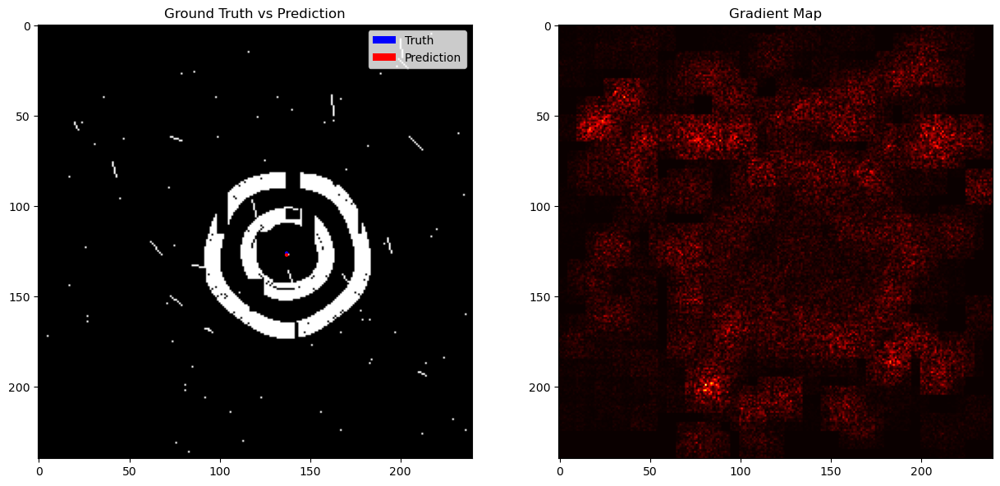

Epoch: 12 	Training Loss: 1.2327190157925038e-05 	Validation Loss: 9.117521476905999e-05
GROUND TRUTH center coordinate (x,y): [134, 140]
PREDICTED center coordinate (x,y): [134, 141]


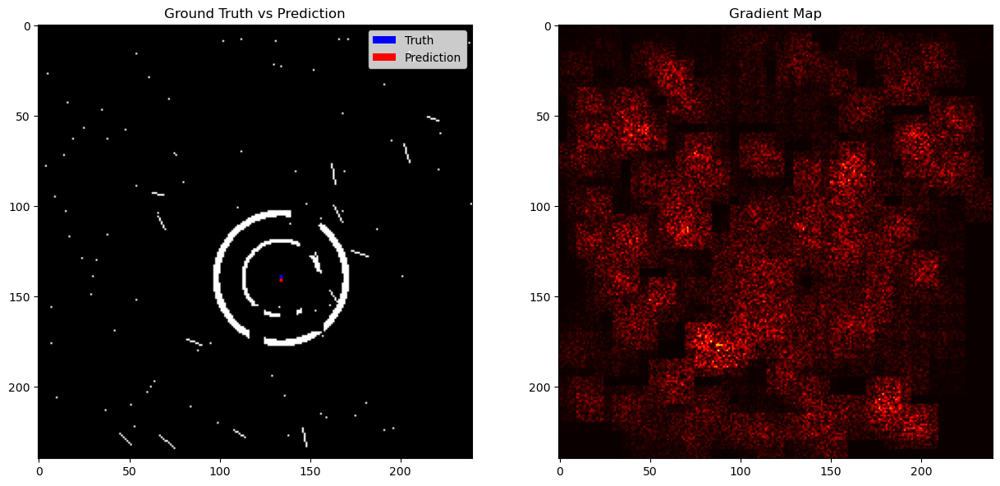

Epoch: 13 	Training Loss: 9.763520173388922e-06 	Validation Loss: 9.005568589135591e-05
GROUND TRUTH center coordinate (x,y): [121, 110]
PREDICTED center coordinate (x,y): [120, 109]


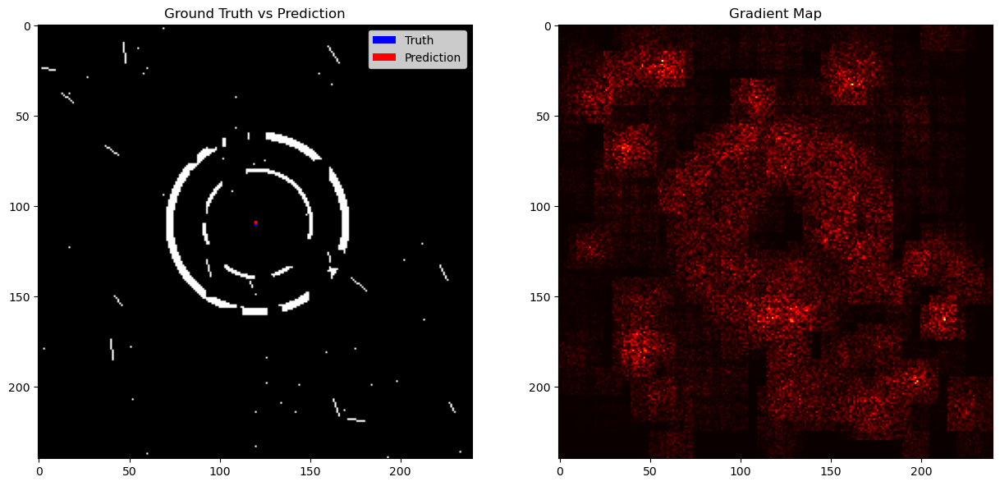

Epoch: 14 	Training Loss: 8.21397572589275e-06 	Validation Loss: 9.028546721674502e-05
GROUND TRUTH center coordinate (x,y): [119, 125]
PREDICTED center coordinate (x,y): [118, 126]


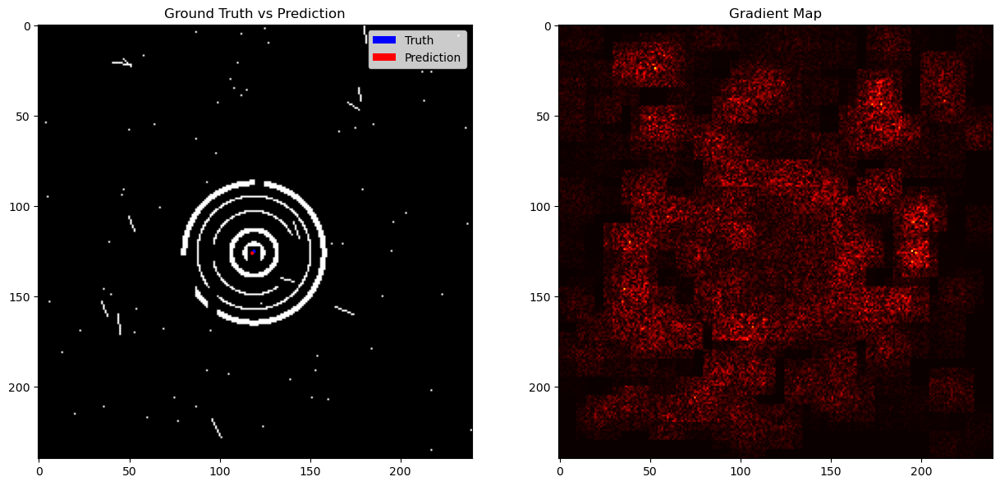

Epoch: 15 	Training Loss: 6.7607122517882895e-06 	Validation Loss: 8.827767144086667e-05
GROUND TRUTH center coordinate (x,y): [113, 138]
PREDICTED center coordinate (x,y): [113, 136]


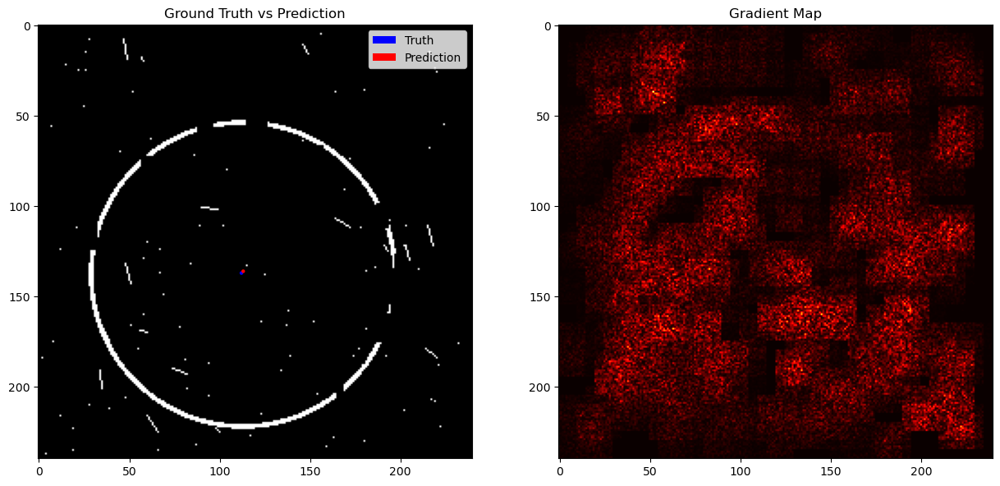

Epoch: 16 	Training Loss: 6.915289201666989e-06 	Validation Loss: 8.645130511528502e-05
GROUND TRUTH center coordinate (x,y): [122, 120]
PREDICTED center coordinate (x,y): [121, 120]


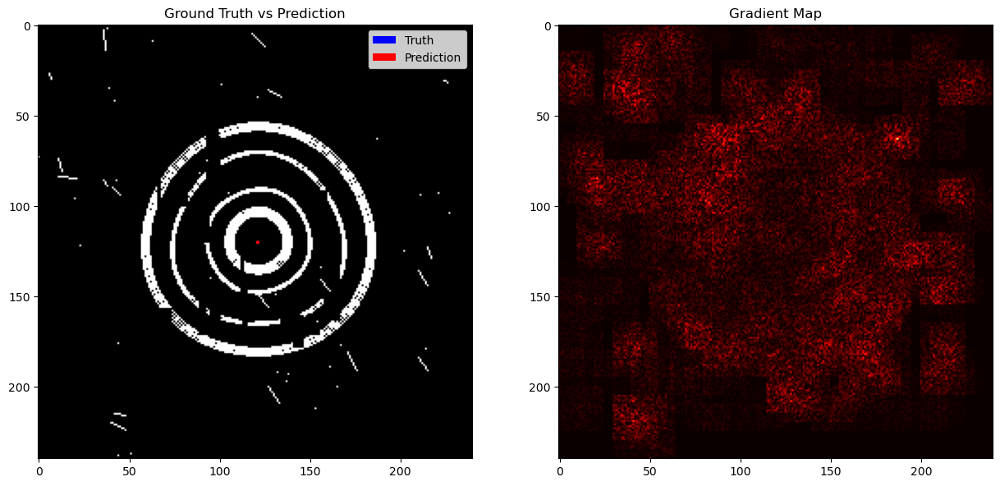

Epoch: 17 	Training Loss: 5.984848937967197e-06 	Validation Loss: 8.584057136128346e-05
GROUND TRUTH center coordinate (x,y): [129, 99]
PREDICTED center coordinate (x,y): [129, 97]


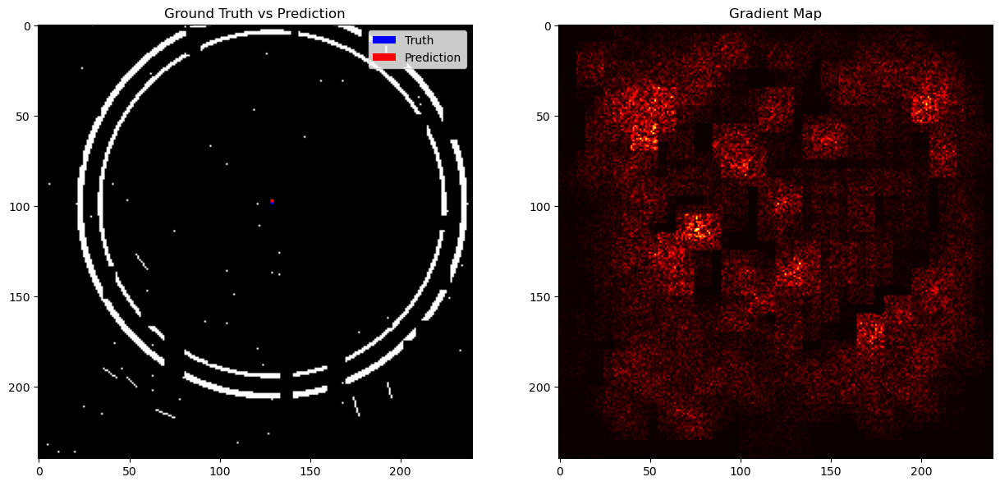

Epoch: 18 	Training Loss: 4.523892860662373e-06 	Validation Loss: 8.603705111697006e-05
GROUND TRUTH center coordinate (x,y): [136, 143]
PREDICTED center coordinate (x,y): [134, 144]


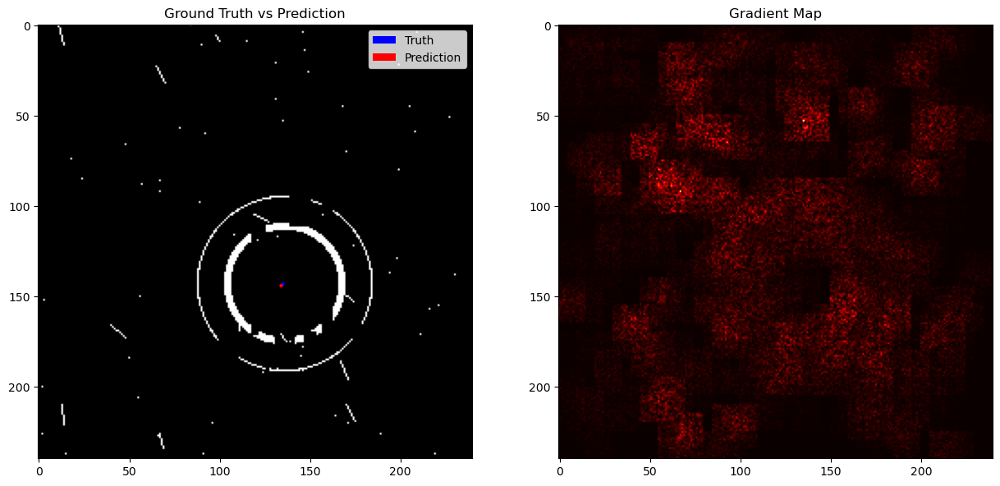

Epoch: 19 	Training Loss: 4.809616767185313e-06 	Validation Loss: 9.34520883537415e-05
GROUND TRUTH center coordinate (x,y): [114, 137]
PREDICTED center coordinate (x,y): [110, 132]


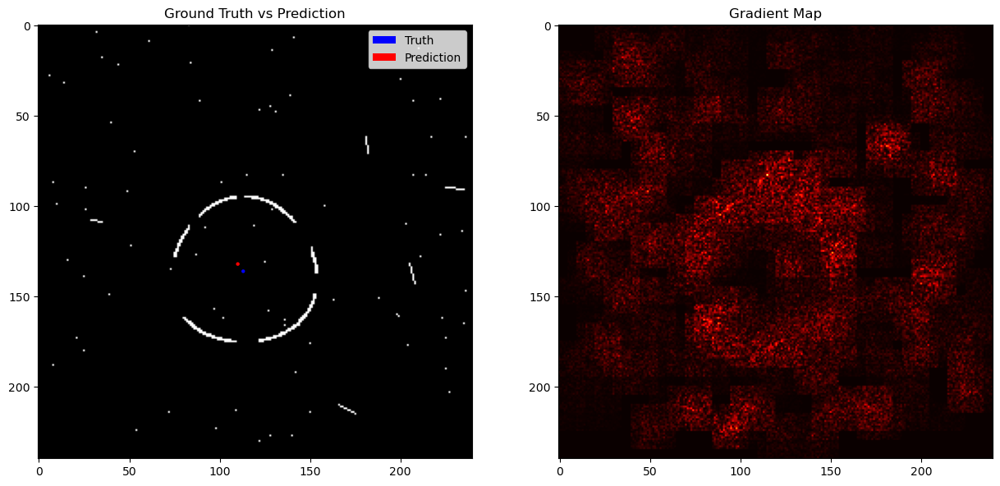

Epoch: 20 	Training Loss: 6.290289098615176e-06 	Validation Loss: 9.127509042284348e-05
GROUND TRUTH center coordinate (x,y): [141, 117]
PREDICTED center coordinate (x,y): [139, 116]


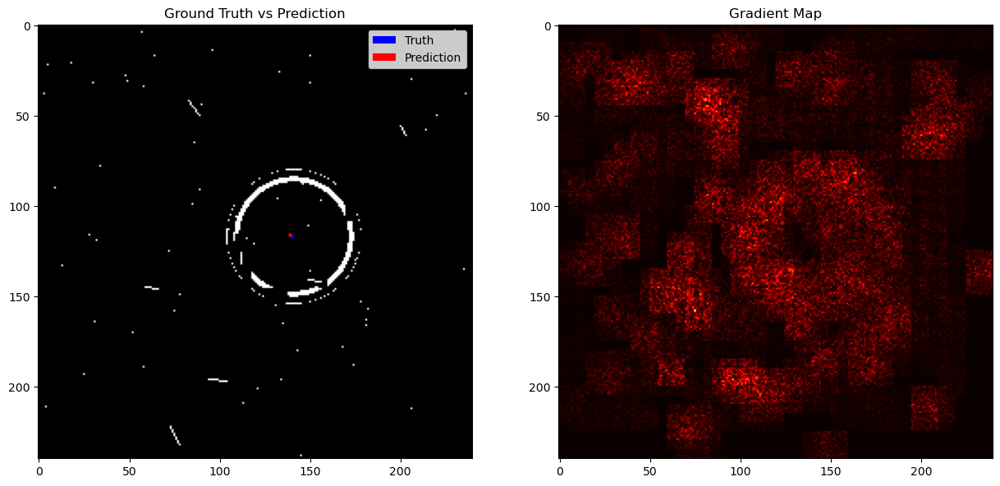

Epoch: 21 	Training Loss: 5.036512185648058e-06 	Validation Loss: 8.362194002580105e-05
GROUND TRUTH center coordinate (x,y): [137, 129]
PREDICTED center coordinate (x,y): [130, 125]


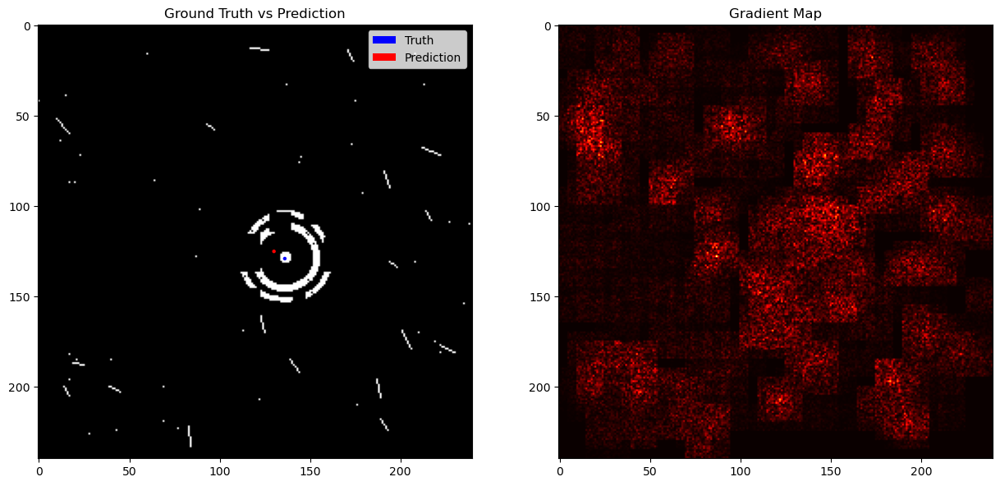

Epoch: 22 	Training Loss: 4.180384610258949e-06 	Validation Loss: 8.533311159893249e-05
GROUND TRUTH center coordinate (x,y): [115, 124]
PREDICTED center coordinate (x,y): [115, 124]


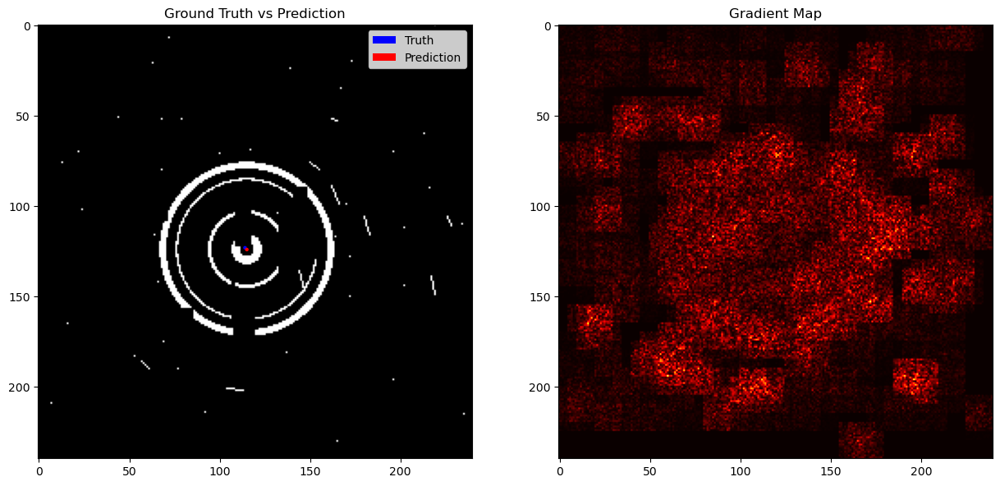

Epoch: 23 	Training Loss: 4.39245576490066e-06 	Validation Loss: 8.72336186779042e-05
GROUND TRUTH center coordinate (x,y): [101, 138]
PREDICTED center coordinate (x,y): [100, 138]


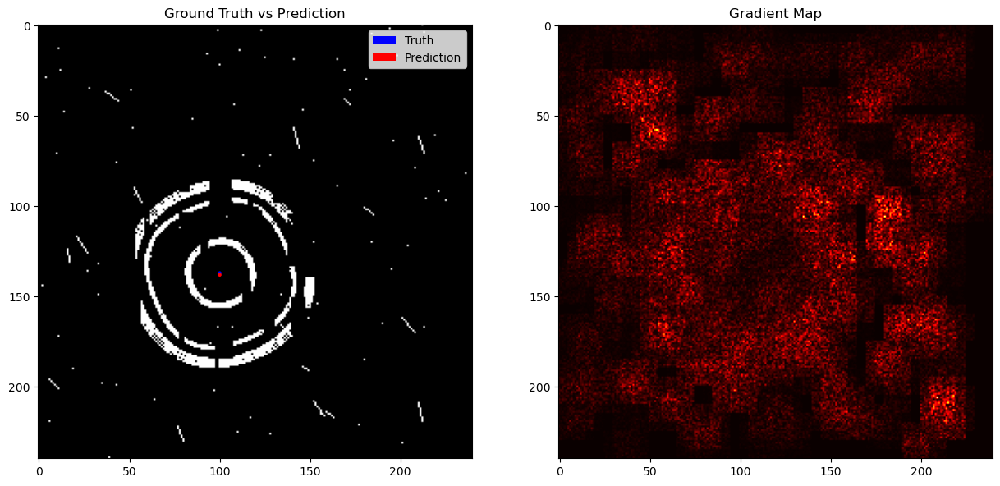

Epoch: 24 	Training Loss: 7.134715778293968e-06 	Validation Loss: 9.61684702261765e-05
GROUND TRUTH center coordinate (x,y): [142, 107]
PREDICTED center coordinate (x,y): [143, 104]


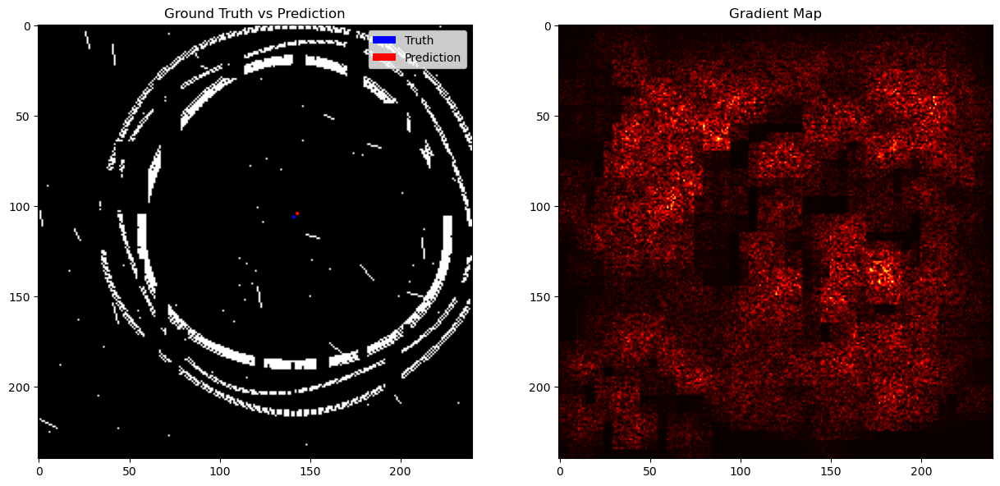

Epoch: 25 	Training Loss: 9.610890159415754e-06 	Validation Loss: 8.84888184534955e-05
GROUND TRUTH center coordinate (x,y): [137, 100]
PREDICTED center coordinate (x,y): [135, 100]


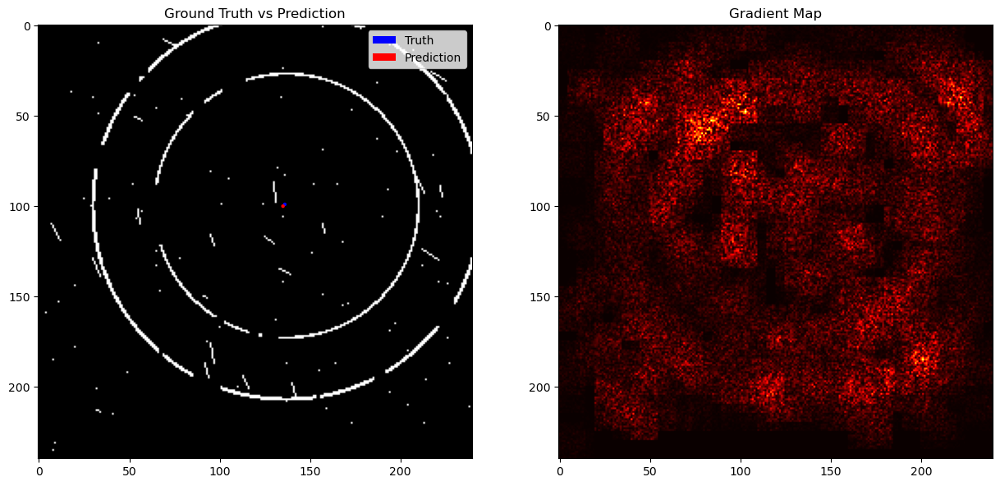

Epoch: 26 	Training Loss: 1.3881834311177954e-05 	Validation Loss: 9.725127147652933e-05
GROUND TRUTH center coordinate (x,y): [143, 126]
PREDICTED center coordinate (x,y): [142, 127]


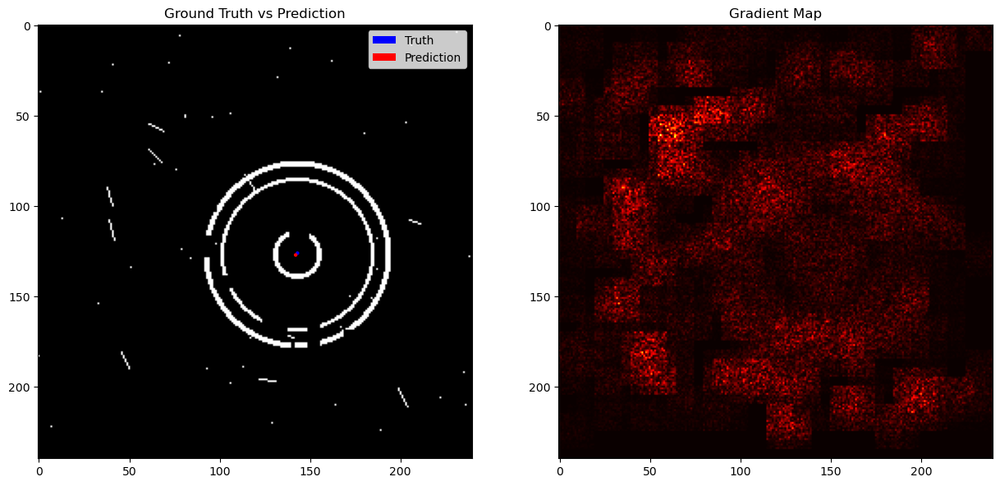

Epoch 00027: reducing learning rate of group 0 to 1.0000e-04.
Epoch: 27 	Training Loss: 1.3219865809434042e-05 	Validation Loss: 9.108553301646477e-05
GROUND TRUTH center coordinate (x,y): [120, 116]
PREDICTED center coordinate (x,y): [122, 112]


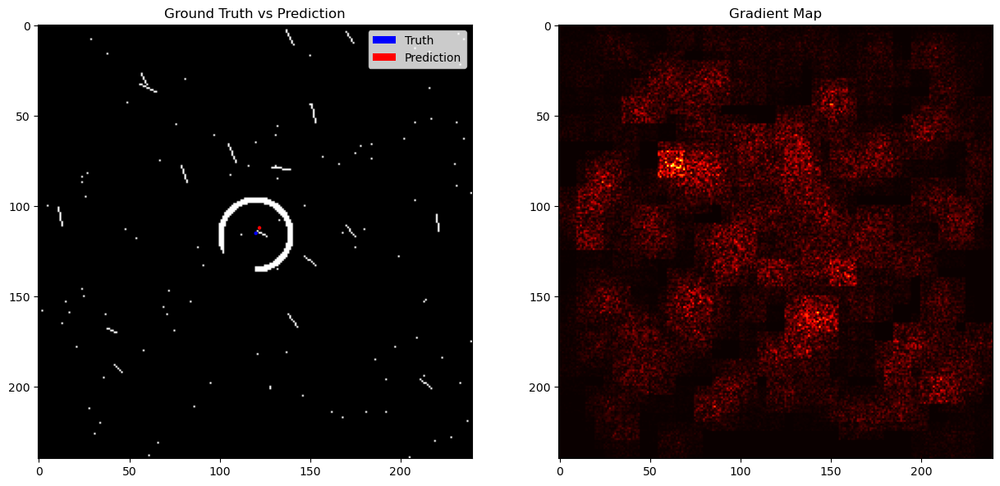

Epoch: 28 	Training Loss: 5.058821567217819e-06 	Validation Loss: 8.254796319589432e-05
GROUND TRUTH center coordinate (x,y): [132, 103]
PREDICTED center coordinate (x,y): [133, 104]


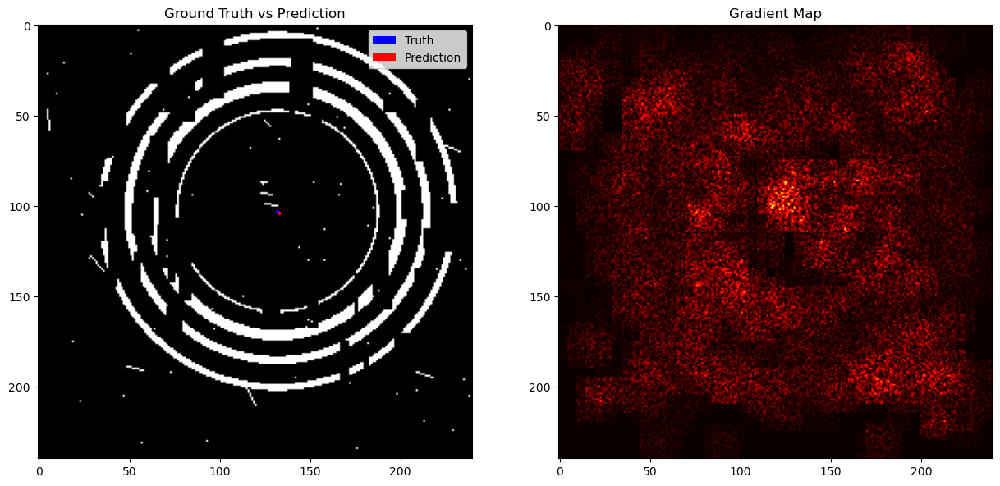

Epoch: 29 	Training Loss: 3.1034469373278425e-06 	Validation Loss: 8.135390522753976e-05
GROUND TRUTH center coordinate (x,y): [123, 136]
PREDICTED center coordinate (x,y): [120, 135]


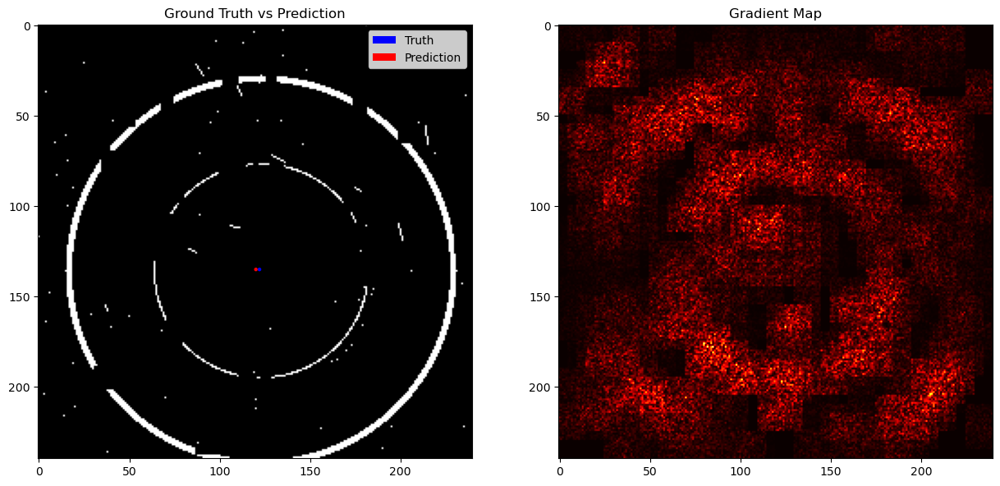

Epoch: 30 	Training Loss: 2.519026042338939e-06 	Validation Loss: 8.186068098034917e-05
GROUND TRUTH center coordinate (x,y): [133, 141]
PREDICTED center coordinate (x,y): [132, 142]


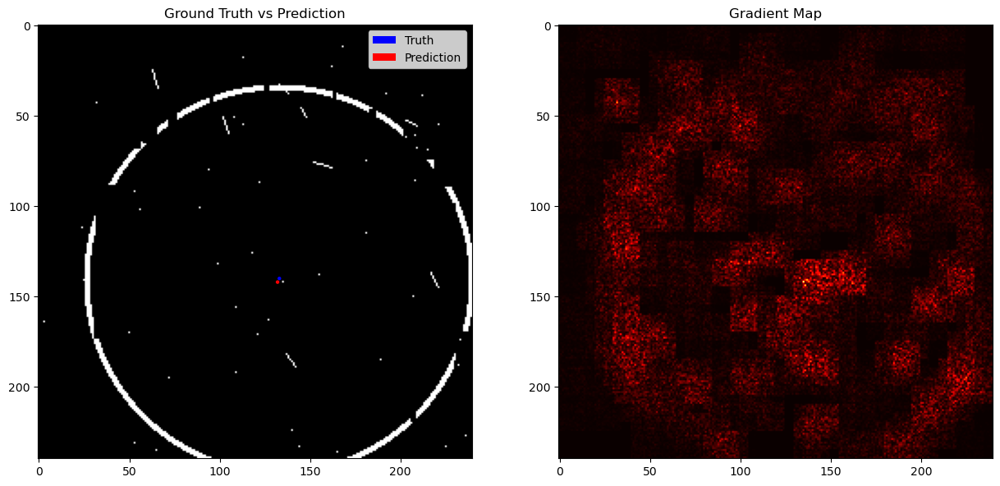

Epoch: 31 	Training Loss: 2.086621615287893e-06 	Validation Loss: 8.144622656012264e-05
GROUND TRUTH center coordinate (x,y): [108, 111]
PREDICTED center coordinate (x,y): [110, 111]


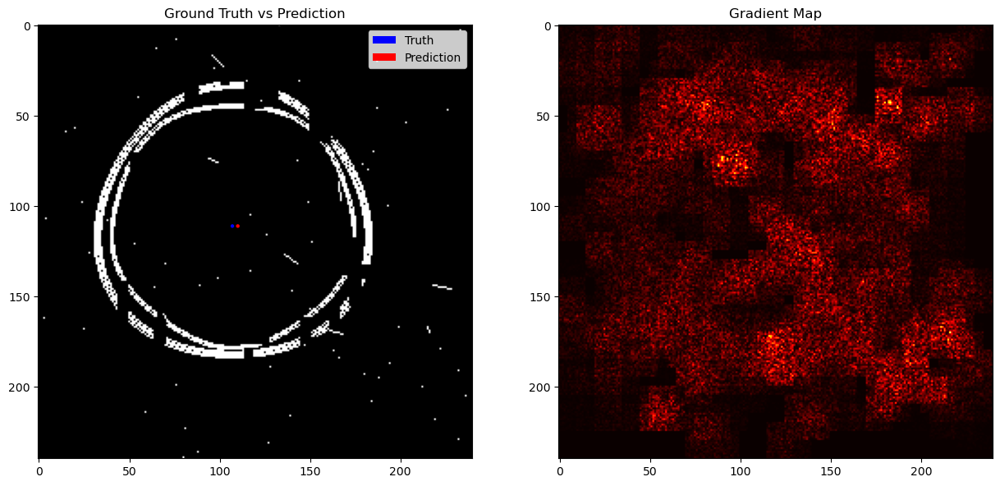

Epoch: 32 	Training Loss: 1.8032561620202614e-06 	Validation Loss: 8.153905918718213e-05
GROUND TRUTH center coordinate (x,y): [119, 136]
PREDICTED center coordinate (x,y): [119, 134]


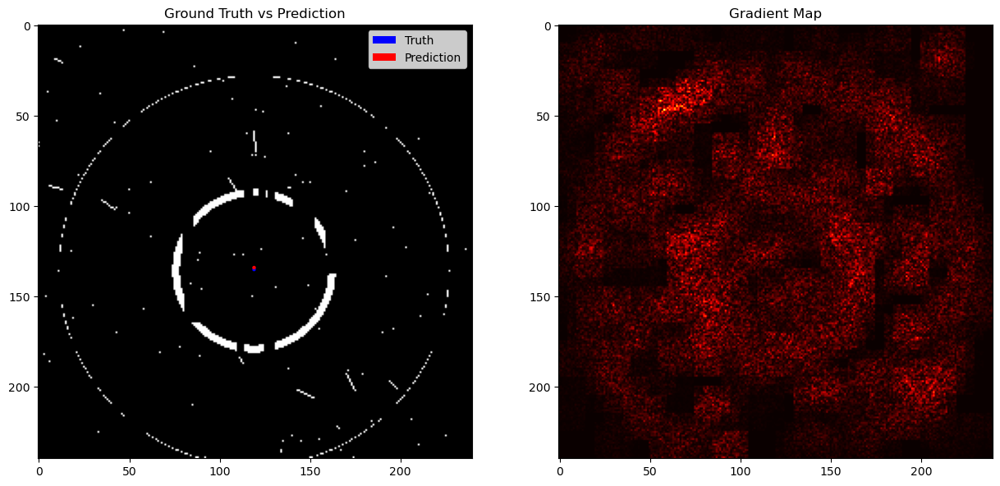

Epoch: 33 	Training Loss: 1.52082839071631e-06 	Validation Loss: 8.15822159816485e-05
GROUND TRUTH center coordinate (x,y): [112, 128]
PREDICTED center coordinate (x,y): [117, 126]


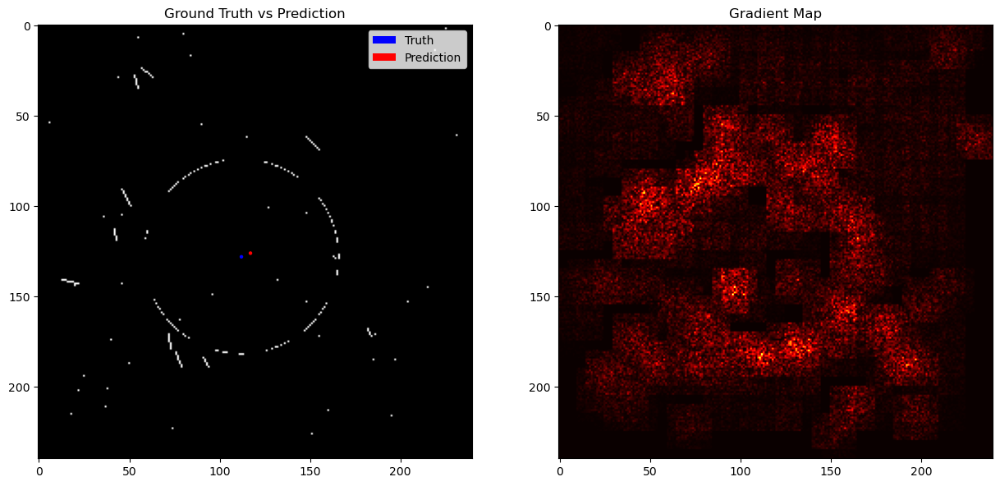

Epoch: 34 	Training Loss: 1.2891931421816278e-06 	Validation Loss: 8.145873755630519e-05
GROUND TRUTH center coordinate (x,y): [137, 112]
PREDICTED center coordinate (x,y): [136, 111]


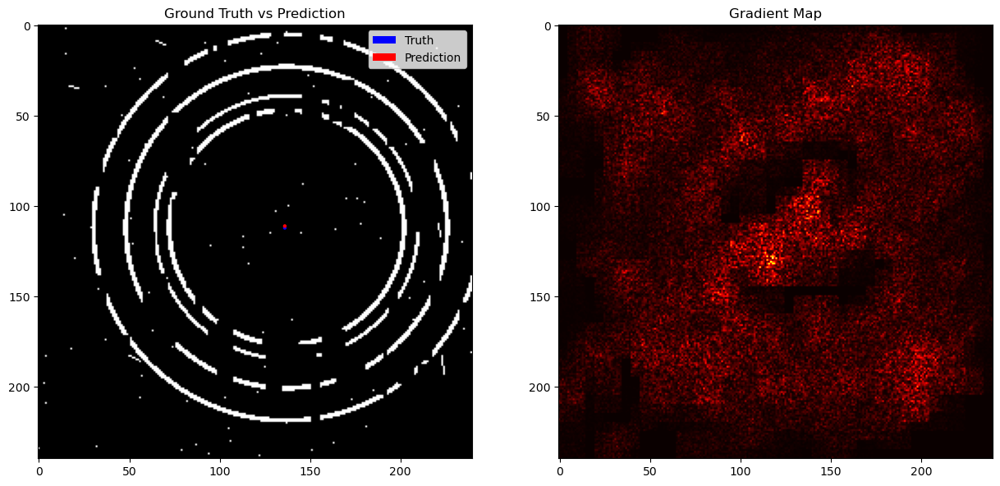

Epoch 00035: reducing learning rate of group 0 to 1.0000e-05.
Epoch: 35 	Training Loss: 1.1745990081585154e-06 	Validation Loss: 8.207441499689594e-05
GROUND TRUTH center coordinate (x,y): [113, 125]
PREDICTED center coordinate (x,y): [112, 125]


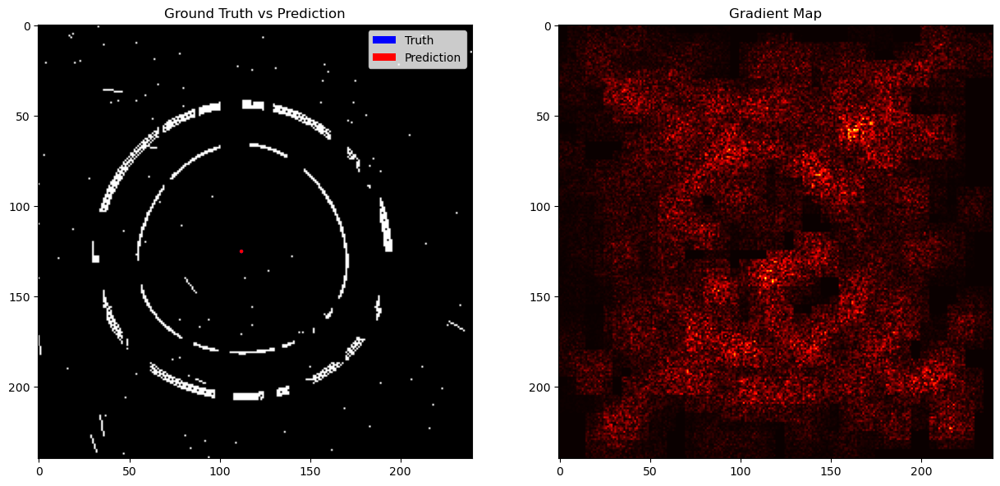

Epoch: 36 	Training Loss: 9.619853954063729e-07 	Validation Loss: 8.176262401037901e-05
GROUND TRUTH center coordinate (x,y): [111, 121]
PREDICTED center coordinate (x,y): [112, 120]


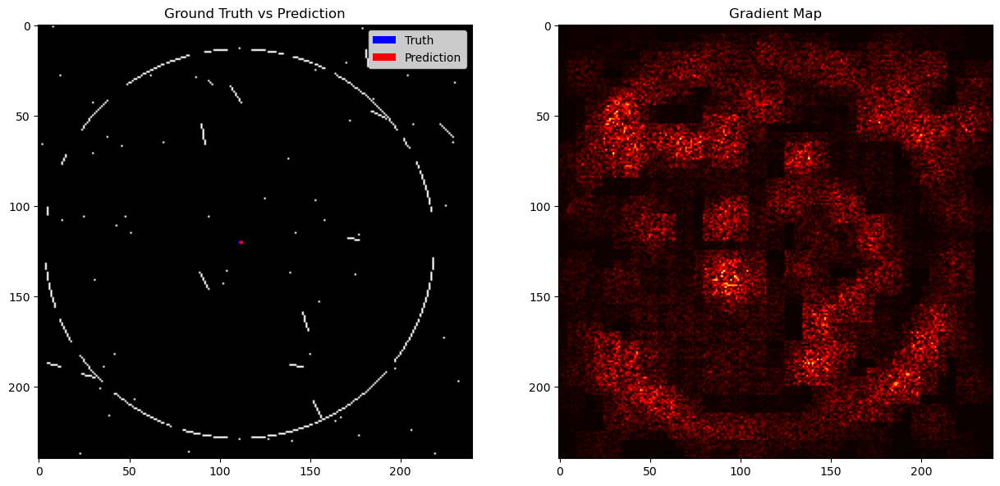

Epoch: 37 	Training Loss: 9.35762135870593e-07 	Validation Loss: 8.175742219706687e-05
GROUND TRUTH center coordinate (x,y): [107, 134]
PREDICTED center coordinate (x,y): [108, 137]


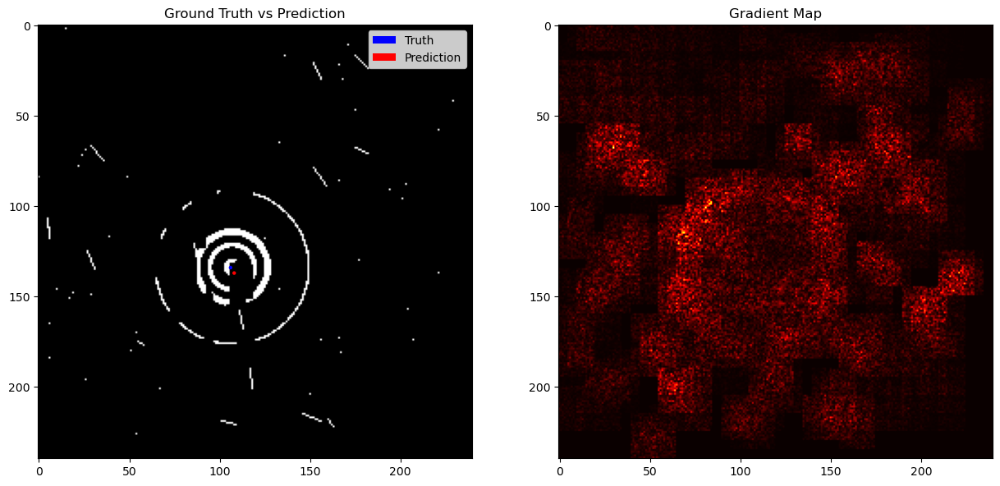

Epoch: 38 	Training Loss: 9.232121268622803e-07 	Validation Loss: 8.167405374762085e-05
GROUND TRUTH center coordinate (x,y): [138, 105]
PREDICTED center coordinate (x,y): [136, 107]


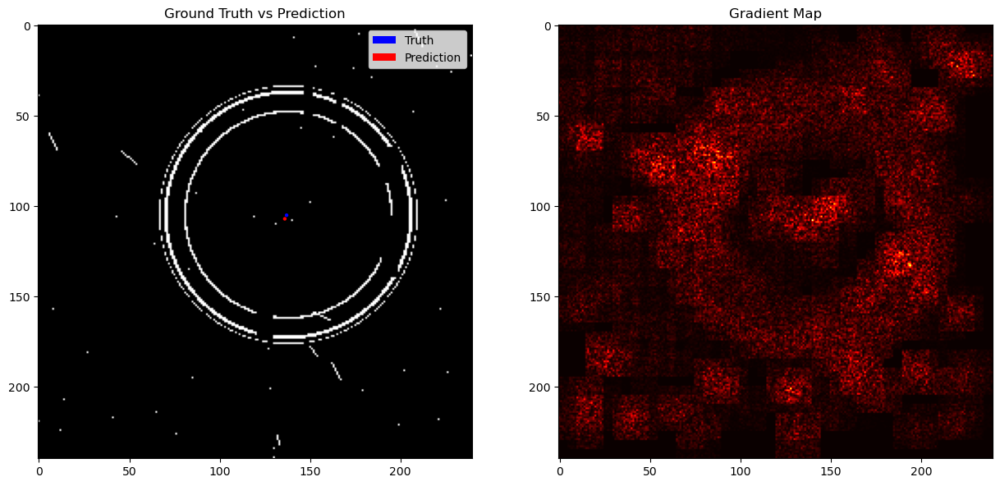

Epoch: 39 	Training Loss: 9.104415885303752e-07 	Validation Loss: 8.16543613489355e-05
GROUND TRUTH center coordinate (x,y): [120, 131]
PREDICTED center coordinate (x,y): [120, 128]


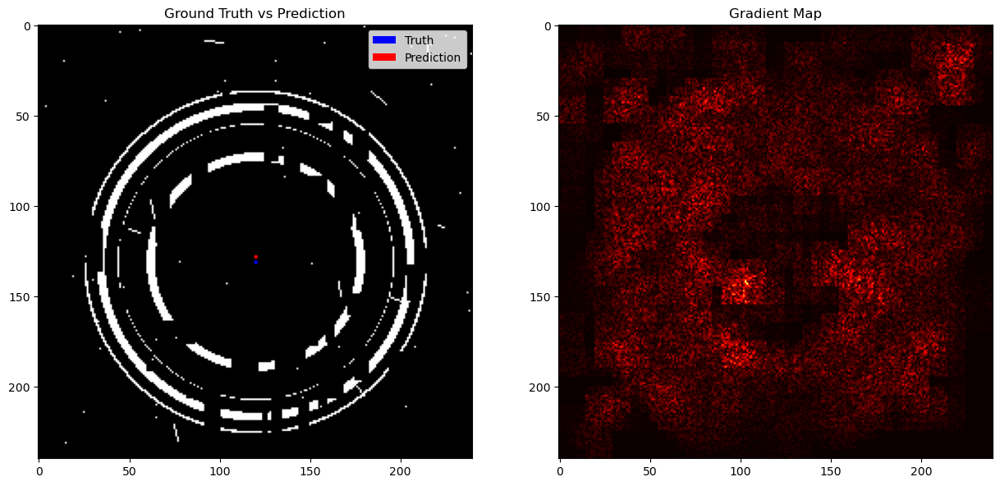

Epoch: 40 	Training Loss: 8.984007594234653e-07 	Validation Loss: 8.166764470257072e-05
GROUND TRUTH center coordinate (x,y): [131, 140]
PREDICTED center coordinate (x,y): [132, 141]


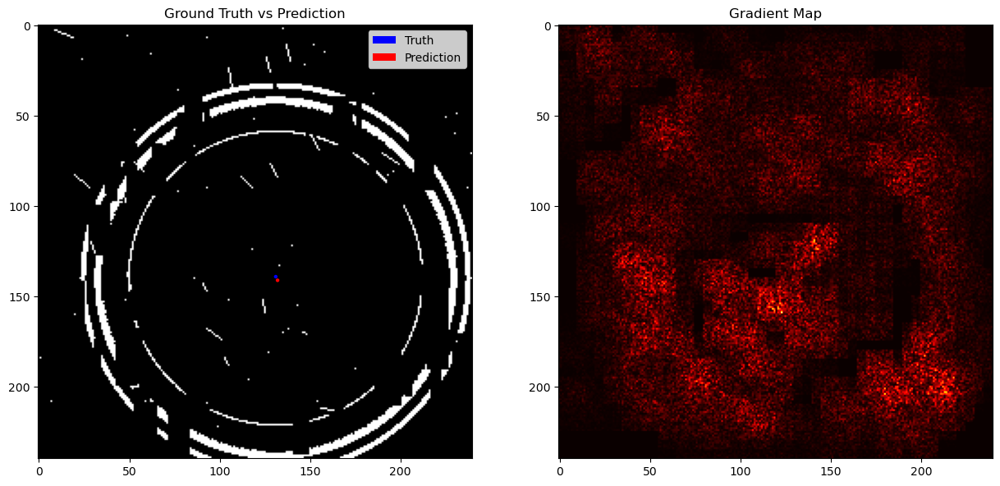

Epoch 00041: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 41 	Training Loss: 8.920021552209316e-07 	Validation Loss: 8.161933068186045e-05
GROUND TRUTH center coordinate (x,y): [138, 120]
PREDICTED center coordinate (x,y): [137, 117]


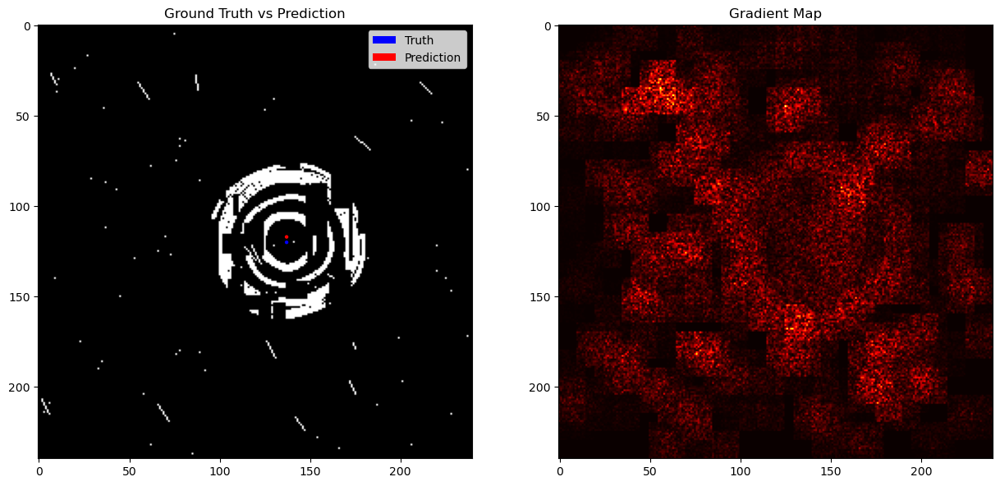

Epoch: 42 	Training Loss: 8.673828564901164e-07 	Validation Loss: 8.166555134165618e-05
GROUND TRUTH center coordinate (x,y): [103, 120]
PREDICTED center coordinate (x,y): [101, 120]


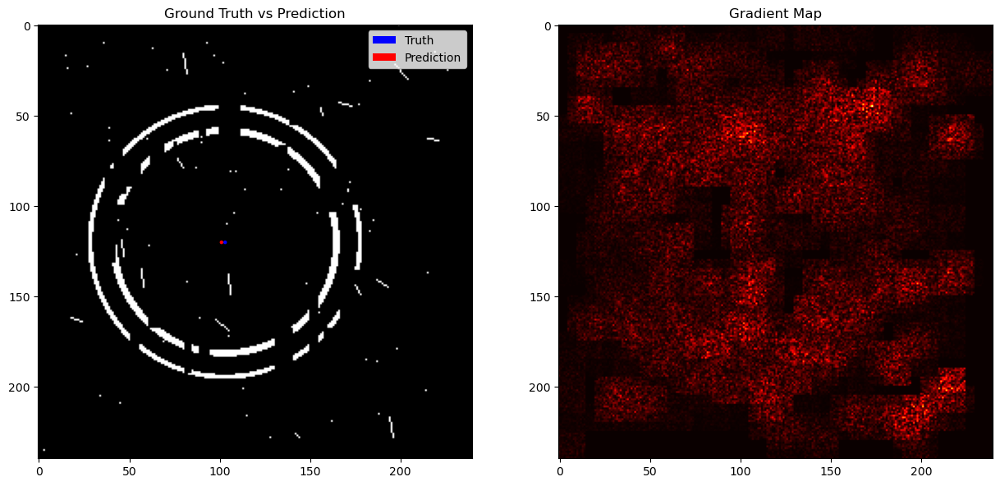

Epoch: 43 	Training Loss: 8.637070585185332e-07 	Validation Loss: 8.167548923908423e-05
GROUND TRUTH center coordinate (x,y): [99, 98]
PREDICTED center coordinate (x,y): [97, 97]


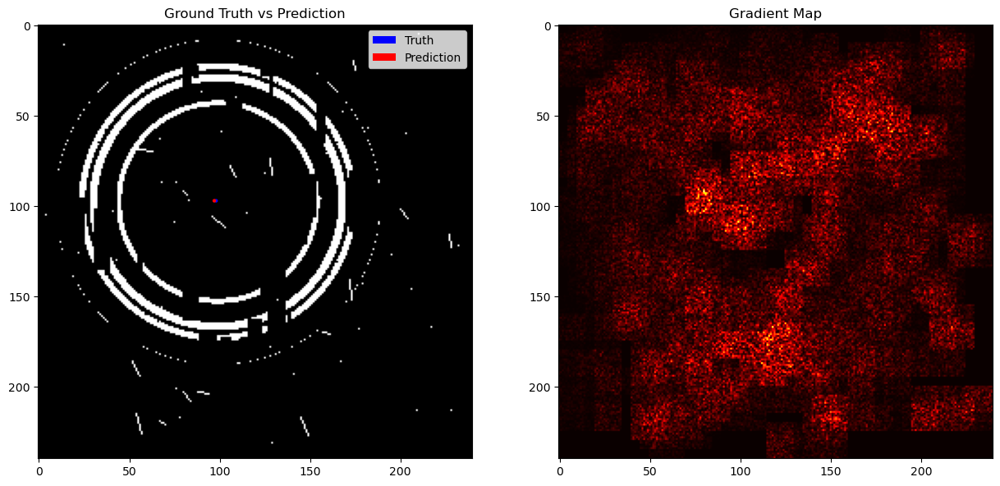

Epoch: 44 	Training Loss: 8.624153315395234e-07 	Validation Loss: 8.167889814164179e-05
GROUND TRUTH center coordinate (x,y): [104, 112]
PREDICTED center coordinate (x,y): [103, 112]


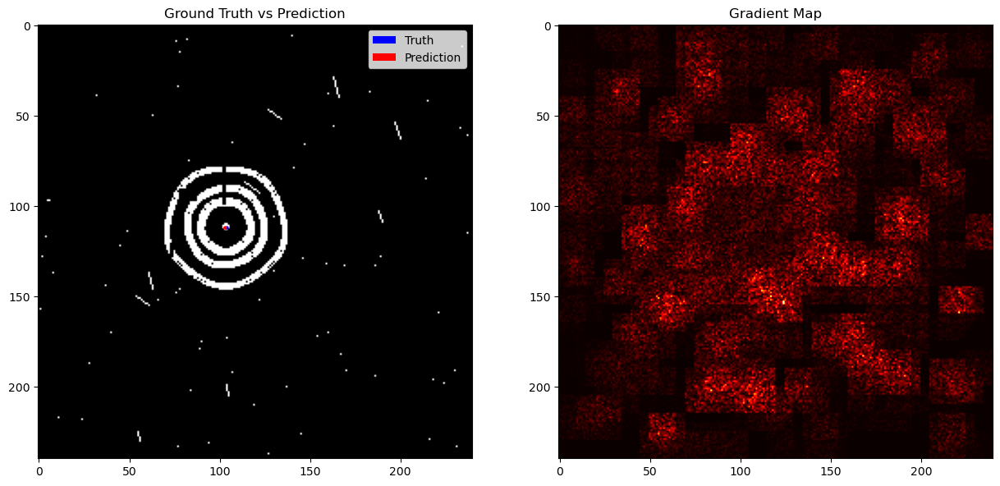

Epoch: 45 	Training Loss: 8.612784885271039e-07 	Validation Loss: 8.169526731944643e-05
GROUND TRUTH center coordinate (x,y): [108, 122]
PREDICTED center coordinate (x,y): [106, 121]


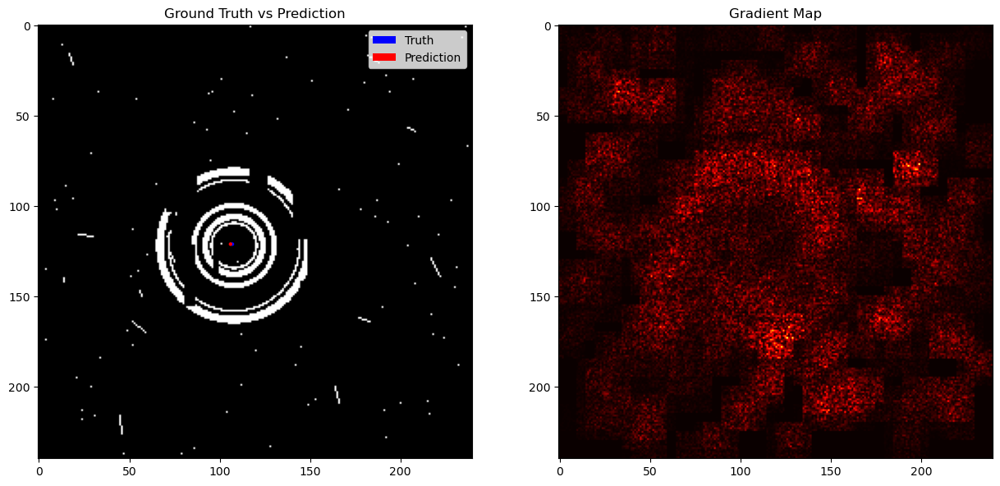

Epoch: 46 	Training Loss: 8.597362790775757e-07 	Validation Loss: 8.168608347477857e-05
GROUND TRUTH center coordinate (x,y): [141, 135]
PREDICTED center coordinate (x,y): [143, 136]


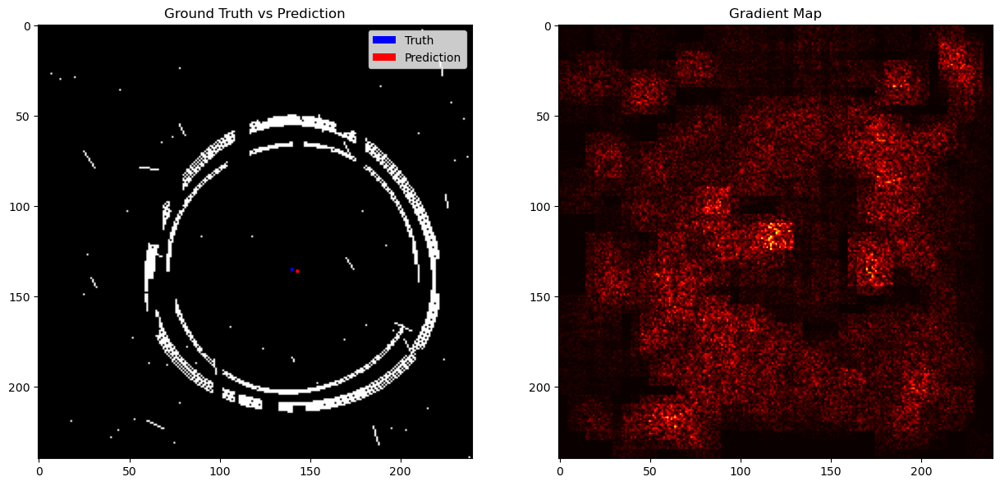

Epoch 00047: reducing learning rate of group 0 to 1.0000e-07.
Epoch: 47 	Training Loss: 8.58382002914166e-07 	Validation Loss: 8.167986960809989e-05
GROUND TRUTH center coordinate (x,y): [128, 123]
PREDICTED center coordinate (x,y): [126, 122]


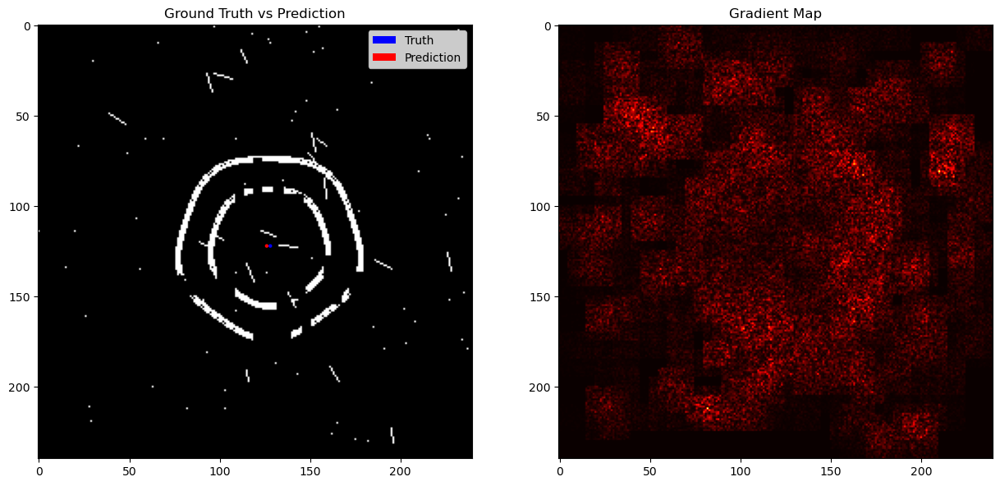

Epoch: 48 	Training Loss: 8.555495145527755e-07 	Validation Loss: 8.167913128919382e-05
GROUND TRUTH center coordinate (x,y): [110, 103]
PREDICTED center coordinate (x,y): [111, 102]


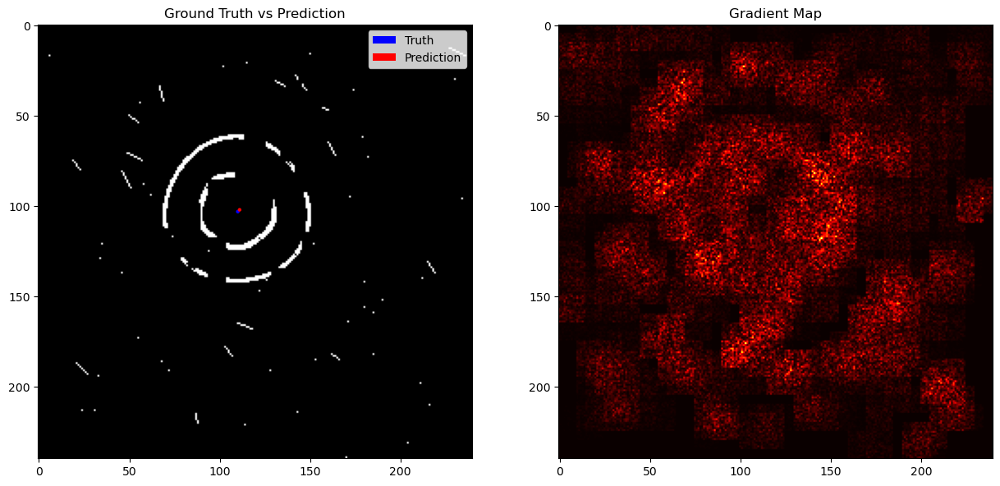

Epoch: 49 	Training Loss: 8.554095050183403e-07 	Validation Loss: 8.167884174165213e-05
GROUND TRUTH center coordinate (x,y): [142, 107]
PREDICTED center coordinate (x,y): [140, 107]


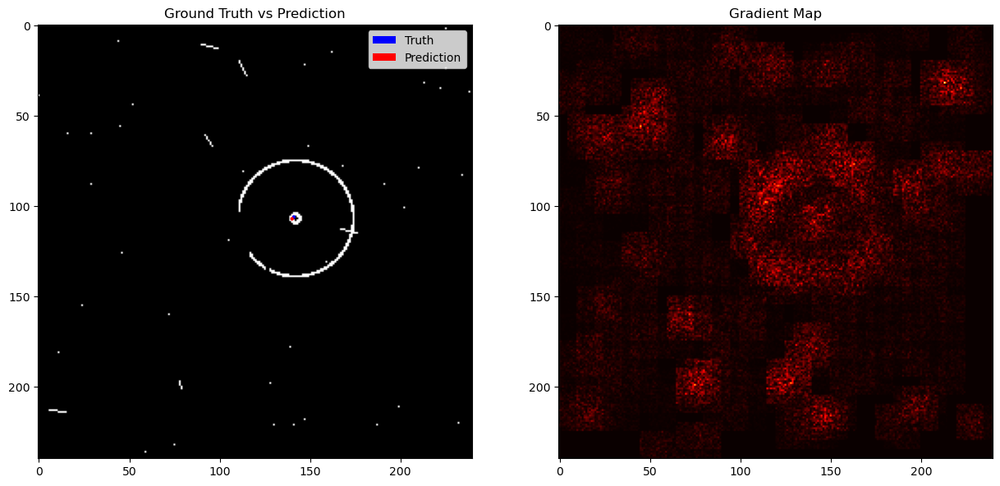

Epoch: 50 	Training Loss: 8.551878499929444e-07 	Validation Loss: 8.167882628428439e-05


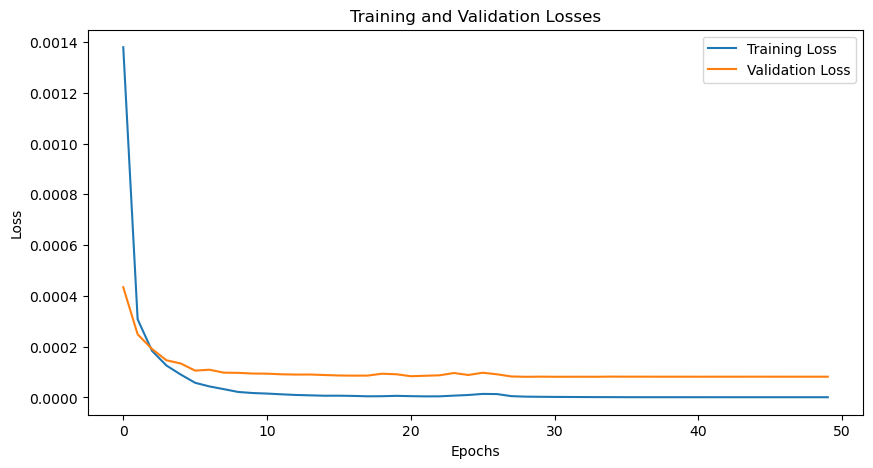

In [30]:
#______________________________/Model Architecture\_______________________________
class CircleNet(nn.Module):
    def __init__(self):
        super(CircleNet, self).__init__()

        self.features = nn.Sequential(
            nn.Conv2d(1, 30, kernel_size=int(DIMENSION/16), stride=5, padding=0),
            nn.MaxPool2d(kernel_size=4, stride=2),
            nn.ReLU(inplace=True),
            nn.Conv2d(30, 60, kernel_size=4, stride=2, padding=0),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.ReLU(inplace=True)
        )

        self.regressor_coord = nn.Sequential(
            nn.Linear(60 * 5 * 5, 120),
            nn.ReLU(inplace=True),
            nn.Linear(120, 60),
            nn.ReLU(inplace=True),
            nn.Linear(60, 2),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.features(x)
        self.feature_maps = x.detach()
        x = x.view(x.size(0), -1)
        x = self.regressor_coord(x)
        return x

#_______________________________\____________________/__________________________________

#_______________________________/Model Initialization\__________________________________
model = CircleNet()
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5, verbose=True)

num_epochs = 50
visual_frequency = 1

train_losses = []
valid_losses = []

# Check if CUDA is available and set device to GPU if it is
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# Move your model to the device
model = model.to(device)


#__________________________________/Training Sequence\_________________________________________
for epoch in range(num_epochs):

    train_loss = 0.0 # Initialize loss variables for current epoch
    valid_loss = 0.0 

    #---Train Step---#
    model.train()
    for images, targets, sample_ids in train_dataloader:

        images = images.to(device)   
        targets = targets.to(device) # load data to device (gpu if cuda, else cpu)

        outputs = model(images) # run input data through model --> predictions
        loss = criterion(outputs, targets) # evaluate predictions against ground truths using some criterion
 
        optimizer.zero_grad() # clear previous batch gradients

        loss.backward() # calculate gradients and perform back propogation
        optimizer.step() # update parameters in accordance with current gradient information

        train_loss += loss.item() * images.size(0) # Accumulate training batch loss into running total



    #---Validation Step---#
    model.eval()

    if epoch % visual_frequency == 0:
        visuals_displayed = True # Flag for visual aids at the epoch frequency basis

    for images, targets, sample_ids in valid_dataloader:

        images = images.to(device)
        targets = targets.to(device) # loading data

        outputs = model(images) # create predictions
        loss = criterion(outputs, targets) # evaluate predictions and determine loss

        valid_loss += loss.item() * images.size(0) # Accumulate validation batch loss into running total


        #-----------------------------/Visualizations\-----------------------------
        if visuals_displayed:
            
            image = images[0].unsqueeze(0)  # Choose one image from the batch
            image.requires_grad = True

            ex_output = model(image)  # Forward pass
            ex_loss = criterion(ex_output, targets[0].unsqueeze(0))  # Compute loss

            model.zero_grad()

            ex_loss.backward()  # Backward pass to compute gradients

            gradients = image.grad.abs().squeeze().cpu().numpy()  # Get the gradients

            # Resize the heatmap
            heatmap_pil = Image.fromarray(gradients)
            heatmap_resized = heatmap_pil.resize((DIMENSION, DIMENSION))

            # Convert back to numpy array
            heatmap = np.array(heatmap_resized)

            

            fig, axs = plt.subplots(1, 2, figsize=(15,7))  # create a figure with 3 subplots

            # Display original image with ground truth pixel highlighted
            image_np = images[0].squeeze().cpu().numpy()  # convert the image tensor to numpy array
            axs[0].imshow(image_np, cmap='gray')  # display the image

            ground_truth = targets[0].cpu().numpy()  # get the ground truth pixel coordinates
            print(f'GROUND TRUTH center coordinate (x,y): {[int(component) for component in DIMENSION * ground_truth]}')
            predicted = ex_output[0].detach().cpu().numpy()  # get the predicted pixel coordinates
            print(f'PREDICTED center coordinate (x,y): {[int(component) for component in DIMENSION *predicted]}')

            Truth = mpatches.Circle((int(DIMENSION * ground_truth[0]),
                                     int(DIMENSION * ground_truth[1])), radius=1, facecolor='blue')  # create a blue circle at ground truth pixel
            Prediction = mpatches.Circle((int(DIMENSION * predicted[0]), 
                                          int(DIMENSION * predicted[1])), radius=1, facecolor='red')  # create a red circle at predicted pixel
            
            axs[0].add_patch(Truth) 
            axs[0].add_patch(Prediction) # Add truth/predicted pixel markers

            proxy_T = mpatches.Circle((int(DIMENSION * ground_truth[0]),
                                     int(DIMENSION * ground_truth[1])), radius=1, facecolor='blue', label='Truth')
            proxy_P = mpatches.Circle((int(DIMENSION * predicted[0]), 
                                          int(DIMENSION * predicted[1])), radius=1, facecolor='red', label='Prediction')

            axs[0].legend(handles=[proxy_T, proxy_P])
            axs[0].set_title("Ground Truth vs Prediction")

            # Display gradient map
            axs[1].imshow(heatmap, cmap='hot')  # display the gradient map
            axs[1].set_title("Gradient Map")

            plt.show()

        visuals_displayed = False
        # ----------------------------------------------------------------------

    train_loss = train_loss / len(train_dataloader.dataset) # Calculate average training loss for the epoch across all batches
    valid_loss = valid_loss / len(valid_dataloader.dataset) # Calculate averagre validation loss for the epoch across all batches

    scheduler.step(valid_loss)

    
    train_losses.append(train_loss)
    valid_losses.append(valid_loss)


    print(f'Epoch: {epoch+1} \tTraining Loss: {train_loss} \tValidation Loss: {valid_loss}')

save_checkpoint(model=model, path=f'CircleNet[{CURRENT_TIME}]')

plt.figure(figsize=(10,5))
plt.plot(train_losses, label='Training Loss')
plt.plot(valid_losses, label='Validation Loss')
plt.title('Training and Validation Losses')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()